# Рынок заведений общественного питания Москвы #

**Основная цель и задачи проекта - подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты**

**Ход исследования:** 
 
На первоначальном этапе будут загружены и изучены данные из датасета '/datasets/moscow_places.csv'. В дальнейшем будет выполнена проверка на дубликаты, пропуски. Для целей анализа будут добавлены столбцы 'street' и 'is_24_7'.
<br />

В ходе анализа данных будут проведены исследования объектов общественного питания, количество посадочных мест, соотношения сетевых и несетевых заведений, рейтинги, средние чеки. Также будут изучены ТОП-15 улиц по количеству заведений и ТОП-15 сетевых заведений. Для визуализации исследования будут использованы графики, гистограммы, диаграммы, картограммы.
<br />

В заключительной части детализируем исследование: изучим возможности открытия кофейни. Будет проанализировано количество кофеен по округам, их рейтинги, время работы. В общем выводе будут даны рекомендации по открытию кофейни в Москве.


**План работы:**

1. [Изучение общей информации](#start)

2. [Предобработка данных](#preprocessing)
    * [Обработка дубликатов](#duplicates)
    * [Обработка пропущенных значений и аномалий](#null)
    * [Добавление столбцов](#addition)
     
    
3. [Анализ данных](#analysis)
    * [Исследование количества объектов общественного питания](#analysis_cat)
    * [Исследование количества посадочных мест в местах по категориям](#analysis_seat)
    * [Рассмотрим соотношение сетевых и несетевых заведений](#analysis_set)
    * [Найдем топ-15 популярных сетей в Москве.](#analysis_top_set)
    * [Анализ количества заведений по районам](#analysis_dist)
    * [Анализ средних рейтингов по категориям заведений](#analysis_rat)
    * [Построим фоновую картограмму со средним рейтингом заведений каждого района](#analysis_horop)
    * [Отобразим все заведения датасета на карте с помощью кластеров](#analysis_klaster)
    * [Найдем топ-15 улиц по количеству заведений](#analysis_top_street)
    * [Найдем улицы, на которых находится только один объект общепита](#analysis_street_one)
    * [Анализ средних чеков заведений](#analysis_median_check)
    * [Исследование заведений с плохими рейтингами](#analysis_bad_raiting)
    * [Общий вывод](#analysis_bad_raiting)
    
4. [Анализ целесообразности открытия кофейни](#analysis_coffee_house)
    * [Анализ кофеен в датасете](#analysis_coffcount)
    * [Проанализируем есть ли круглосуточные кофейни](#analysis_coffee_allday)
    * [Рейтинги кофеен и как они распределяются по районам](#analysis_coffee_raiting)
    * [Рассчитаем на какую стоимость чашки капучино стоит ориентироваться при открытии](#analysis_coffee_raiting)
    
5. [Подготовка презентации](#presentation)    
    

1. [Изучение общей информации](#start)

In [94]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from pandas.plotting import register_matplotlib_converters
import warnings
import scipy.stats as stats

In [95]:
path = '/Users/andreyakimushkin/Downloads/'

data = pd.read_csv(path + 'moscow_places.csv') 

In [96]:
#Выведем основную информацию о датафрейме методом info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [97]:
#Ознакомимся с данными
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [98]:
#Посчитаем количество уникальных заведений в датафрейме

data['name'].nunique()

5614

**Вывод:** В датафрейме представлено 14 столбцов. Общее количество строк, представленных в таблице равно 8406. Число уникальных наименований заведений - 5614 (помним, что сетевые заведения имеют неуникальные наименования).  7 столбцов хранят данные типа object, 6 тип float и 1 тип int. Ряд столбцов содержат пропуски. Далее более подробно рассмотрим какие столбцы содержат пропуски и с чем это может быть связано.

2. [Предобработка данных](#preprocessing)

* [Обработка дубликатов](#duplicates)

In [99]:
#проверим данные на явные дубликаты
data.duplicated().sum()

0

In [100]:
#проверим данные на дубликаты по нескольким столбцам одновременно
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

data[data.duplicated(['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [101]:
#Удалим дубликаты
data = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True) 

In [102]:
data[data.duplicated(['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


**Вывод:** Теперь дубликатов в таблице нет.

  * [Обработка пропущенных значений и аномалий](#null)

In [103]:
#Выведем количество пропущенных значений для каждого столбца
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

**Вывод:** Довольно большое количество пропусков в датафрейме. В частности, в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. 

In [104]:
#В столбце price содержатся текстовые категориальные данные, которые определяются величиной среднего чека. Изучим эти данные
data['price'].sort_values().unique()

array(['высокие', 'выше среднего', 'низкие', 'средние', nan], dtype=object)

In [105]:
#Рассмотрим все категории представленные в таблице
category_price = (
    data.groupby(['category', 'price'])
    .agg({'middle_avg_bill': 'mean'})
)
category_price

middle_avg_bill
category        price                         
бар,паб         высокие            2285.555556
                выше среднего      1354.009901
                низкие              170.000000
                средние             794.958042
булочная        высокие            2250.000000
                выше среднего      1050.000000
                низкие              166.666667
                средние             498.571429
быстрое питание высокие            3816.666667
                выше среднего      1300.000000
                низкие              156.857143
                средние             429.953642
кафе            высокие            2133.333333
                выше среднего      1302.739726
                низкие              207.692308
                средние             585.574786
кофейня         высокие            1814.705882
                выше среднего      1310.000000
                низкие              173.250000
                средние             484.340741
пиццерия        высокие            2077.241379
                выше среднего      1348.571429
                низкие              225.000000
                средние             679.200000
ресторан        высокие            2646.183206
                выше среднего      1359.325397
                низкие              324.761905
                средние             709.348449
столовая        высокие            3750.000000
                выше среднего      1225.000000
                низкие              202.000000
                средние             317.359712

**Вывод:** категорию price можно было бы заполнить на основе данных category и middle_avg_bill, однако анализ представленного датафрейма показал, что отсутствие данных в столбце middle_avg_bill преимущественно ведет к NaN в category. Заменим NaN на "нет категории" 

In [106]:
data['price'] = data['price'].fillna('нет категории')
#проверка на наличие пропуска
data['price'].isna().sum()

0

In [107]:
#столбцы avg_bill и middle_avg_bill связаны между собой. Посмотрим что за текстовые значения у нас содержатся в столбце avg_bill 
data['avg_bill'].sort_values().unique()

array(['Средний счёт:100 ₽', 'Средний счёт:1000 ₽',
       'Средний счёт:1000–10000 ₽', 'Средний счёт:1000–1100 ₽',
       'Средний счёт:1000–1200 ₽', 'Средний счёт:1000–1300 ₽',
       'Средний счёт:1000–1350 ₽', 'Средний счёт:1000–1400 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1000–1600 ₽',
       'Средний счёт:1000–1700 ₽', 'Средний счёт:1000–2000 ₽',
       'Средний счёт:1000–2500 ₽', 'Средний счёт:1000–3000 ₽',
       'Средний счёт:1000–5000 ₽', 'Средний счёт:100–1000 ₽',
       'Средний счёт:100–160 ₽', 'Средний счёт:100–180 ₽',
       'Средний счёт:100–200 ₽', 'Средний счёт:100–2000 ₽',
       'Средний счёт:100–270 ₽', 'Средний счёт:100–300 ₽',
       'Средний счёт:100–330 ₽', 'Средний счёт:100–350 ₽',
       'Средний счёт:100–400 ₽', 'Средний счёт:100–423 ₽',
       'Средний счёт:100–500 ₽', 'Средний счёт:100–599 ₽',
       'Средний счёт:100–700 ₽', 'Средний счёт:1100–1500 ₽',
       'Средний счёт:110–200 ₽', 'Средний счёт:120 ₽',
       'Средний счёт:1200 ₽', 'Средн

**Вывод:** столбец avg_bill содержит не только данные среднего чека, но и цену бокала пива и чашки капучино. Пропуск в строках категории "кофейня" в большинстве случаев закономерен, так как данные о средней цене чашки кофе содержится в столбце middle_coffee_cup. Данные о цене бокала пива нельзя использовать для заполнения столбца middle_avg_bill, так как они не отражают величину среднего чека в баре/пабе. 

In [108]:
#проанализируем аналогично данные в столбце middle_coffee_cup 
data['middle_coffee_cup'].sort_values().unique()

array([  60.,   75.,   79.,   80.,   84.,   89.,   90.,   94.,   95.,
        100.,  102.,  105.,  110.,  112.,  115.,  119.,  120.,  124.,
        125.,  127.,  129.,  130.,  134.,  135.,  137.,  138.,  139.,
        140.,  144.,  145.,  149.,  150.,  154.,  155.,  159.,  160.,
        162.,  164.,  165.,  167.,  169.,  170.,  172.,  174.,  175.,
        179.,  180.,  184.,  185.,  189.,  190.,  195.,  197.,  199.,
        200.,  204.,  205.,  210.,  214.,  215.,  217.,  220.,  225.,
        227.,  229.,  230.,  235.,  237.,  240.,  242.,  245.,  246.,
        250.,  254.,  255.,  256.,  259.,  260.,  265.,  266.,  270.,
        275.,  279.,  285.,  287.,  290.,  291.,  295.,  297.,  300.,
        315.,  320.,  325.,  328.,  375., 1568.,   nan])

**Вывод:** middle_coffee_cup это число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино». Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не входит. Заменять пустые строки средним или медианным значением здесь нецелесообразно. Однако настораживает аномально высокое значение - 1568 в массиве данных.

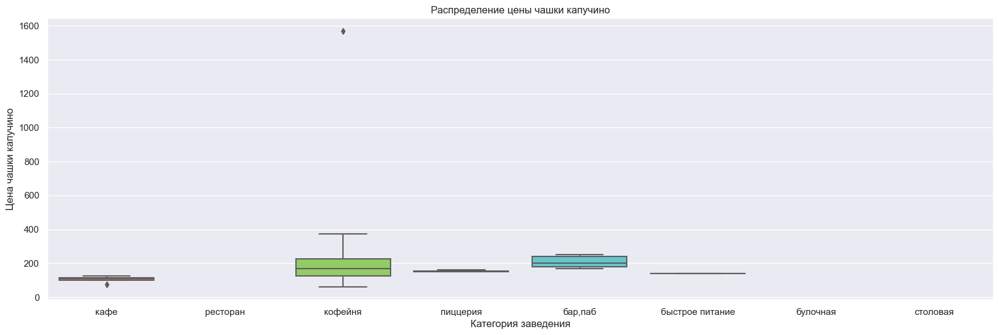

In [109]:
sns.set(rc={'figure.figsize':(20,6)})
ax = sns.boxplot(x='category', y='middle_coffee_cup', data=data, palette='hls') 
plt.title('Распределение цены чашки капучино')
plt.xlabel('Категория заведения')
plt.ylabel('Цена чашки капучино')
plt.show()

In [110]:
#избавимся от выброса (1568) в категории заведения кофейня
data.drop(index=data.query('middle_coffee_cup > 400').index, inplace=True)

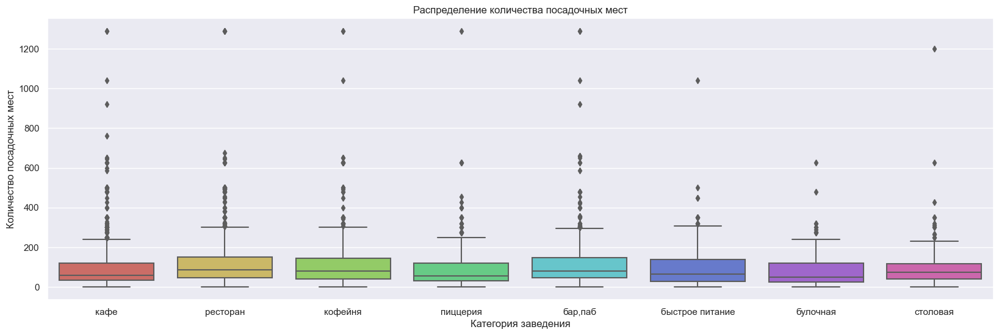

In [111]:
#проанализируем данные в столбце seats
sns.set(rc={'figure.figsize':(20,6)})
ax = sns.boxplot(x='category', y='seats', data=data, palette='hls') 
plt.title('Распределение количества посадочных мест')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

**Вывод:** в столбце seats также много пропусков, заполнение средним или медианным значением по категории заведения вряд ли будет целесообразным. Так как, на величину посадочных мест может влиять является ли оно сетевым и что это за сеть, район расположения, рейтинг заведения.
<br />

А вот на величину аномальных значений произведем корректировку. Отбросим все заведения с количеством посадочных мест более 600. 

In [112]:
#избавимся от выброса в столбце seats
data.drop(index=data.query('seats > 600').index, inplace=True)

* [Добавление столбцов](#addition)

In [113]:
data['street'] = data['address'].str.split(', ').str[1]
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет категории,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет категории,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**Вывод:** в представленном датасете присутствовали и дубликаты, и пропуски. Скрытые дубликаты были удалены. Большое количество пропусков содержалось в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Все они были проанализированы на возможности заполнения медианными или средними показателями.
<br />

Также в датасете были найдены аномалии. Для того, чтобы исключить их влияние на анализ данных, аномалии были удалены.

3. [Анализ данных](#analysis)

* [Исследование количества объектов общественного питания](#analysis_cat)

In [114]:
category_name = (
    data.groupby(['category'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
category_name.columns = ['category', 'count']
category_name

,category,count
0,кафе,2364
1,ресторан,2030
2,кофейня,1400
3,"бар,паб",755
4,пиццерия,629
5,быстрое питание,602
6,столовая,313
7,булочная,255


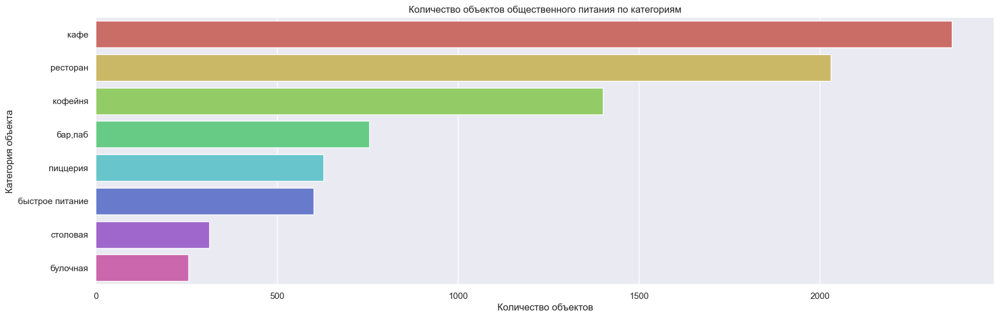

In [115]:
# назначаем размер графика
plt.figure(figsize=(20, 6))
# строим столбчатый график средствами seaborn
sns.barplot(x='count', y='category', data=category_name, palette = "hls")
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество объектов общественного питания по категориям')
plt.xlabel('Количество объектов')
plt.ylabel('Категория объекта')
# отображаем график на экране
plt.show()

**Вывод:** самая многочисленная категория заведений - кафе, на втором месте - ресторан. Кафе - это, как-правило, заведение с более демократичным ценником, чем ресторан. Кроме того, это заведение может отличать, обширное меню, которое ориентировано на широкую аудиторию. Кофейни находятся на третьем месте по количеству, их на 41% меньше, чем кафе.
<br />

На четвертом месте по количеству заведений - бар (755 шт.), на пятом - пиццерия (629 шт.), а на шестом - быстрое питание (602 шт.). Все эти заведения ориентированы на определенную целевую аудиторию, обладают менее обширным меню. Закономерно, что их количество в общем перечне категорий меньше. 
<br />

Самые малочисленные категории заведений - столовая (313 шт.) и булочная (255 шт.)

* [Исследование количества посадочных мест в местах по категориям](#analysis_seat)

In [116]:
#общее количество посадочных мест в категории
category_seats = (
    data.groupby(['category'])
    .agg({'seats': 'count'})
    .sort_values(by='seats', ascending=False)
    .reset_index()
)
category_seats.columns = ['category', 'count_seats']
category_seats

,category,count_seats
0,ресторан,1257
1,кафе,1205
2,кофейня,738
3,"бар,паб",458
4,пиццерия,423
5,быстрое питание,348
6,столовая,162
7,булочная,147


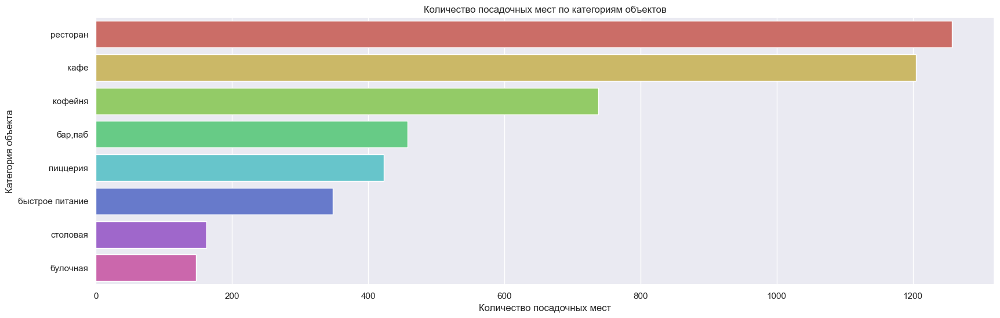

In [117]:
# назначаем размер графика
plt.figure(figsize=(20, 6))
# строим столбчатый график средствами seaborn
sns.barplot(x='count_seats', y='category', data=category_seats, palette="hls")
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество посадочных мест по категориям объектов')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория объекта')
# отображаем график на экране
plt.show()

In [118]:
#медианное количество посадочных мест в категории
category_seats = (
    data.groupby(['category'])
    .agg({'seats': 'median'})
    .sort_values(by='seats', ascending=False)
    .reset_index()
)
category_seats.columns = ['category', 'median_seats']
category_seats

,category,median_seats
0,ресторан,86.0
1,"бар,паб",80.0
2,кофейня,78.0
3,столовая,75.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,50.0


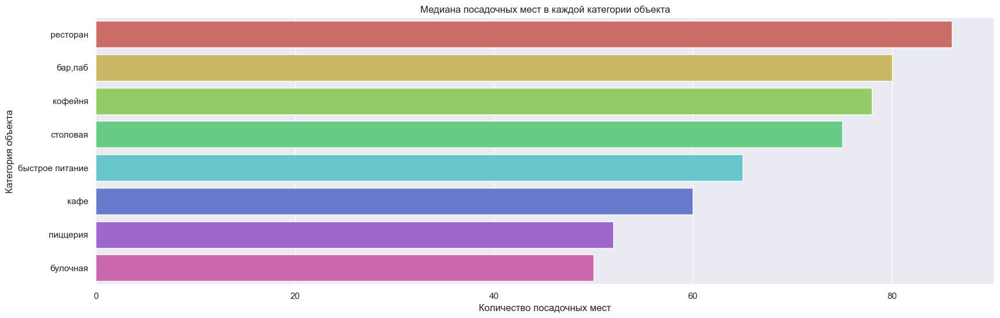

In [119]:
# назначаем размер графика
plt.figure(figsize=(20, 6))
# строим столбчатый график средствами seaborn
sns.barplot(x='median_seats', y='category', data=category_seats, palette="hls")
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Медиана посадочных мест в каждой категории объекта')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория объекта')
# отображаем график на экране
plt.show()

**Вывод:** по общему количеству посадочных мест на первое место выходят рестораны (1257 шт.), но кафе от этой категории отстает незначительно (1205 шт.). На третьем месте по прежнему кофейня с 738 посадочными местами.
<br />

Если анализировать отдельно взятое заведение в каждой категории, то тут на первом месте по-прежнему ресторан с 86 посадочными местами, а вот на втором - бар (80 мест). Кофейня и здесь на третьем месте с 78 посадочными местами.
А вот в кафе, как-правило, только 60 мест и это лишь 6-е место в общем перечне категорий.
<br />

Самые небольшие заведения - пиццерия (52 места) и булочная (50 мест).

  * [Рассмотрим соотношение сетевых и несетевых заведений](#analysis_set)

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [120]:
#общее количество посадочных мест в категории
data['chain'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
count_chain = (
    data.groupby(['chain'])
    .agg({'name': 'count'})
    #.sort_values(by='name', ascending=False)
    .reset_index()
)
count_chain.columns = ['chain', 'count_chain']
count_chain

,chain,count_chain
0,несетевое,5172
1,сетевое,3176


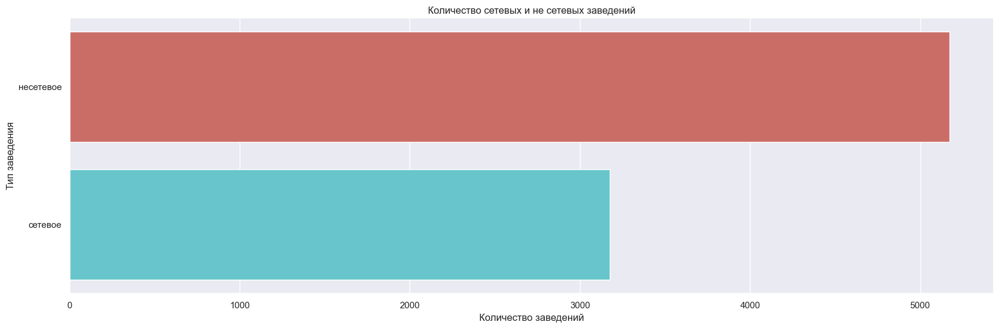

In [121]:
# назначаем размер графика
plt.figure(figsize=(20, 6))
# строим столбчатый график средствами seaborn
sns.barplot(x='count_chain', y='chain', data=count_chain, palette='hls')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество сетевых и не сетевых заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Тип заведения')
# отображаем график на экране
plt.show()

In [122]:
#Разделим все категории на сетевые и нет
category_chain = (
    data.groupby(['category', 'chain'])
    .agg({'name': 'count'})
    .sort_values(by=['category','name'])
    .reset_index()
)
category_chain.columns = ['category', 'chain', 'count']
category_chain

,category,chain,count
0,"бар,паб",сетевое,167
1,"бар,паб",несетевое,588
2,булочная,несетевое,99
3,булочная,сетевое,156
4,быстрое питание,сетевое,231
5,быстрое питание,несетевое,371
6,кафе,сетевое,774
7,кафе,несетевое,1590
8,кофейня,несетевое,688
9,кофейня,сетевое,712


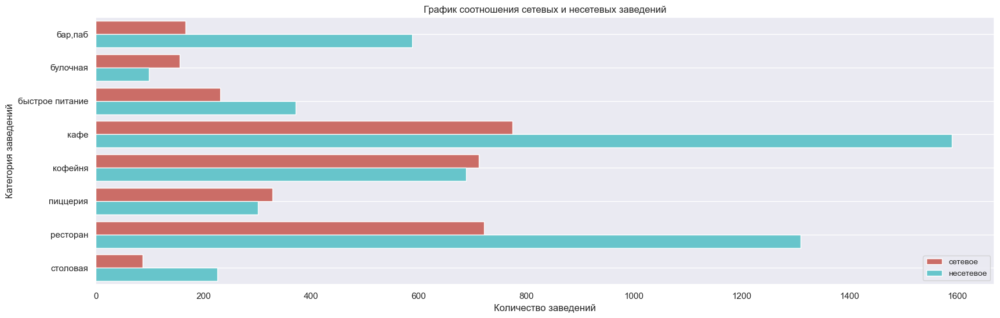

In [123]:
sns.barplot(x='count', y='category', data=category_chain, hue='chain', palette='hls')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График соотношения сетевых и несетевых заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведений')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

**Вывод:** общее количество сетевых заведений - 3176 шт., в то время как несетевых -  5172 шт.
<br />

При этом, есть две категории, где количество сетевых заведений превышает несетевые - это пиццерии (328 против 301) и кофейни (712 против 688).
<br />

В категории кафе и рестораны количество несетевых заведений значительно больше, чем сетевых. Так, в категории кафе, сетевых заведений всего 774, а несетевых в 2 раза больше - 1590. Аналогичная ситуация и с ресторанами: 721 сетевой против 1309 несетевых.  

* [Найдем топ-15 популярных сетей в Москве.](#analysis_top_set)

In [124]:
top_chain = data[data['chain'] == 'сетевое']
top_15 = (
    top_chain.groupby('name')
    .agg({'rating': 'median','district' : 'count', 'category' : pd.Series.mode })
    .sort_values('district', ascending = False)
    .reset_index()
    .head(15)
)
top_15.columns = ['name', 'rating', 'count','category']
top_15

,name,rating,count,category
0,шоколадница,4.20,117,кофейня
1,домино'с пицца,4.20,76,пиццерия
2,додо пицца,4.30,74,пиццерия
3,one price coffee,4.20,70,кофейня
4,яндекс лавка,4.00,68,ресторан
5,cofix,4.10,65,кофейня
6,prime,4.20,50,ресторан
7,хинкальная,4.40,44,кафе
8,кофепорт,4.20,42,кофейня
9,теремок,4.10,38,ресторан


In [125]:
# строим столбчатую диаграмму 
fig = px.bar(top_15.sort_values(by='count', ascending=True), # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
            )

fig.update_layout(title='ТОП-15 сетевых заведений',
                   xaxis_title='Количество сетевых заведений',
                   yaxis_title='Наименование заведения',
                   showlegend = False
                 )
fig.show() 

**Вывод:** самые популярные сетевые заведения в Москве - "Шоколадница", "Домино'c пицца", "Додо пицца". Одно из них относится к категории кофейня, а два других являются пиццериями.
<br />

Наиболее часто встречаемой категорией в сетевых заведенях является именно кофейня. Так, помимо "Шоколадницы", в ТОП-15 входит "One price coffee", "Сofix", кофепорт, "Cofefest".
<br />

 * [Анализ количества заведений по районам](#analysis_dist)

In [126]:
#общее количество заведений
district_count = (
    data.groupby(['district'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
district_count.columns = ['district', 'total_count']
district_count

,district,total_count
0,Центральный административный округ,2242
1,Южный административный округ,891
2,Северо-Восточный административный округ,890
3,Северный административный округ,875
4,Западный административный округ,830
5,Восточный административный округ,790
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,707
8,Северо-Западный административный округ,409


In [127]:
#количество заведений каждой категории по районам
district_category_count = (
    data.groupby(['district', 'category'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
district_category_count.columns = ['district', 'category', 'count']
district_category_count

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [128]:
fig = px.bar(district_category_count.sort_values(by='count', ascending=True), x='count',
             y='district',               
             color='category'
            )
fig.update_layout(title='Общее количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район местонахождения',  
                   yaxis={'categoryorder':'total ascending'},
                   width=1000, 
                   height=550
                 )
fig.show()

**Вывод:** на графике мы видим, что лидирует по числу заведений Центральный административный округ. Самыми большими категориями здесь являются: рестораны и кафе.
<br />

Южный, Северо-Восточный и Северный административный округа имеют примерно равное каоличество заведений ообщественного питания, правда на первом месте здесь кафе, а рестораны только на втором.
<br />

Меньше всего заведений общественного питания в Северо-Западном административном округе.

* [Анализ средних рейтингов по категориям заведений](#analysis_rat)

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [129]:
#средний рейтинг по категориям
rating_mean = (
    data.groupby(['category'])
    .agg({'rating': 'mean'})
    .sort_values(by='rating', ascending=False)
    .reset_index()
)
rating_mean

,category,rating
0,"бар,паб",4.390066
1,пиццерия,4.300636
2,ресторан,4.289852
3,кофейня,4.277429
4,булочная,4.267843
5,столовая,4.211821
6,кафе,4.124408
7,быстрое питание,4.049834


In [130]:
fig = px.histogram(rating_mean, 
                   x='category',
                   y='rating',
                   title='Средний рейтинг по категорям заведений', 
                   nbins=1000)
fig.update_xaxes(title_text='Категория заведения')
fig.update_yaxes(title_text='Рейтинг') 
fig.show() 

**Вывод:** рейтинг заведений меняется незначительно от категории к категории. Самую высокую категорию имеют бары (4.39), а самую низкую - быстрое питание (4.05).
<br />

 * [Построим фоновую картограмму со средним рейтингом заведений каждого района](#analysis_horop)

In [131]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_district

,district,rating
0,Восточный административный округ,4.174557
1,Западный административный округ,4.180000
2,Северный административный округ,4.240229
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172419
8,Южный административный округ,4.184063


In [164]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/Users/andreyakimushkin/Downloads/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


In [165]:
# импортируем карту и хороплет

!pip install folium 
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/andreyakimushkin/Downloads/admin_level_geomap.geojson' # читаем файл и сохраняем в переменной

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** самый высокий рейтинг заведений в Центральном административном округе.
<br />

* [Отобразим все заведения датасета на карте с помощью кластеров](#analysis_klaster)

In [166]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

* [Найдем топ-15 улиц по количеству заведений](#analysis_top_street)

In [167]:
top_15_street = (
    data.groupby('street')
    .agg({'name': 'count'})
    .sort_values('name', ascending = False)
    .reset_index()
    .head(15)
)
top_15_street.columns = ['street','count']
top_15_street

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [136]:
#преобразуем столбец в список
top_15_street_list = top_15_street.street.tolist()
top_15_street_list

['проспект мира',
 'профсоюзная улица',
 'ленинский проспект',
 'проспект вернадского',
 'дмитровское шоссе',
 'каширское шоссе',
 'варшавское шоссе',
 'ленинградский проспект',
 'ленинградское шоссе',
 'мкад',
 'люблинская улица',
 'улица вавилова',
 'кутузовский проспект',
 'пятницкая улица',
 'алтуфьевское шоссе']

In [137]:
top_15_st_cat = data.query("street in @top_15_street_list")
street_category_count = (
    top_15_st_cat.groupby(['street', 'category'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
street_category_count.columns = ['street', 'category', 'count']
street_category_count

,street,category,count
0,проспект мира,кафе,53
1,проспект мира,ресторан,45
2,мкад,кафе,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
108,алтуфьевское шоссе,столовая,1
109,проспект вернадского,булочная,1
110,мкад,столовая,1
111,мкад,"бар,паб",1


In [138]:
fig = px.bar(street_category_count.sort_values(by='count', ascending=True), x='count',
             y='street',               
             color='category'
            )
fig.update_layout(#title='Распределение количества заведений и их категорий по ТОП-15 улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица',  
                   yaxis={'categoryorder':'total ascending'},
                   width=950, 
                   height=600
                 )
fig.show()

**Вывод:** в рейтинге ТОП-15 улиц с большим отрывом лидирует Проспект мира. На этой улице находятся преимущественно кафе, рестораны и кофейни.
<br />

На втором и третьем месте по количеству заведений в рейтинге ТОП-15 улиц располагаются Профсоюзная улица и Ленинский проспект. Здесь также в рейтинге лидируют кафе и рестораны.
<br />

Замыкает ТОП-15 улиц Алтуфьевское шоссе.
<br />

 * [Найдем улицы, на которых находится только один объект общепита](#analysis_street_one)

In [139]:
street_one = data.groupby(['street', 'district'], as_index = False)['name'].count().query('name==1') 
street_one

,street,district,name
0,1-й автозаводский проезд,Южный административный округ,1
1,1-й балтийский переулок,Северный административный округ,1
2,1-й варшавский проезд,Южный административный округ,1
3,1-й вешняковский проезд,Юго-Восточный административный округ,1
5,1-й голутвинский переулок,Центральный административный округ,1
...,...,...,...
1471,электрический переулок,Центральный административный округ,1
1478,юго-западный административный округ,Юго-Западный административный округ,1
1483,якиманский переулок,Центральный административный округ,1
1484,яковоапостольский переулок,Центральный административный округ,1


In [140]:
one_street_list = street_one.street.tolist()
one_street_list

['1-й автозаводский проезд',
 '1-й балтийский переулок',
 '1-й варшавский проезд',
 '1-й вешняковский проезд',
 '1-й голутвинский переулок',
 '1-й грайвороновский проезд',
 '1-й дербеневский переулок',
 '1-й земельный переулок',
 '1-й капотнинский проезд',
 '1-й кирпичный переулок',
 '1-й колобовский переулок',
 '1-й котляковский переулок',
 '1-й курьяновский проезд',
 '1-й николощеповский переулок',
 '1-й новокузнецкий переулок',
 '1-й рижский переулок',
 '1-й самотёчный переулок',
 '1-й сетуньский проезд',
 '1-й спасоналивковский переулок',
 '1-й щипковский переулок',
 '1-я боевская улица',
 '1-я дубровская улица',
 '1-я курьяновская улица',
 '1-я линия хорошёвского серебряного бора',
 '1-я парковая улица',
 '1-я стекольная улица',
 '1-я фрунзенская улица',
 '1-я ямская улица',
 '11-я парковая улица',
 '12-я парковая улица',
 '14-я парковая улица',
 '16-я парковая улица',
 '17-й проезд марьиной рощи',
 '2-й балтийский переулок',
 '2-й боткинский проезд',
 '2-й верхний михайловский пр

In [141]:
one_street_list_cat = data.query("street in @one_street_list")
street_one_count = (
    one_street_list_cat.groupby(['district'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
street_one_count.columns = ['district','count']
street_one_count

,district,count
0,Центральный административный округ,211
1,Южный административный округ,83
2,Юго-Восточный административный округ,79
3,Северо-Восточный административный округ,65
4,Юго-Западный административный округ,60
5,Восточный административный округ,54
6,Западный административный округ,54
7,Северный административный округ,54
8,Северо-Западный административный округ,21


In [142]:
fig = px.histogram(street_one_count, 
                   x='district',
                   y='count',
                   title='Количество улиц, на которых находится по одному заведению. Распределение по округам', 
                   nbins=1000)
fig.update_xaxes(title_text='Наименование округа')
fig.update_yaxes(title_text='Количество улиц') 
fig.show() 

**Вывод:** в Центральном административном округе находится больше всего улиц, на которых располагается одно заведение.
<br />


* [Анализ средних чеков заведений](#analysis_median_check)

In [143]:
median_avg_bill = (
    data.groupby(['district'])
    .agg({'middle_avg_bill': 'median'})
    .sort_values(by='middle_avg_bill', ascending=False)
    .reset_index()
)
median_avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [144]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение чека по районам',
).add_to(m)

# выводим карту
m

**Вывод:** в Центральном и Западном административном округе самое большое значение медианного чека - 1000 рублей. Самое низкое значение чека (от 500 рублей и ниже) - в Северо-Восточном, Южном и Юго-Восточном административных округах.
<br />

В заведениях общественного питания в Москве по округам, прослеживается тенденция, говорящая о том, что стоимость среднего чека коррелирует со стоимостью недвижимости в каждом из округов, а также со степенью удаленности от центра.

* [Исследование заведений с плохими рейтингами](#analysis_bad_raiting)

In [145]:
#проанализируем рейтинги, найдем их максимальную и минимальную величину
data['rating'].describe()

count    8348.000000
mean        4.229887
std         0.471085
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

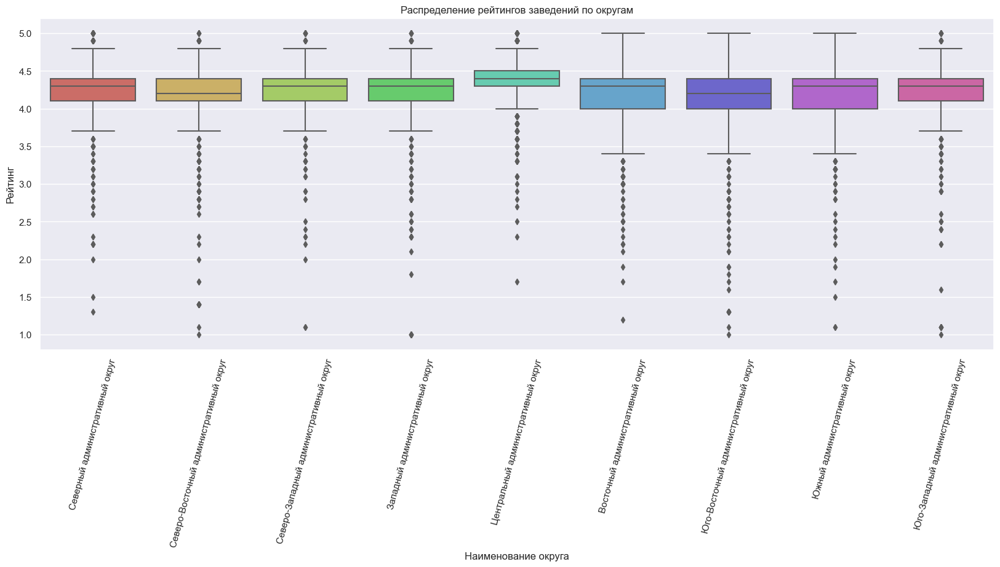

In [146]:
sns.set(rc={'figure.figsize':(20,7)})
ax = sns.boxplot(x='district', y='rating', data=data, palette='hls') 
plt.title('Распределение рейтингов заведений по округам')
plt.xlabel('Наименование округа')
plt.ylabel('Рейтинг')
plt.xticks(rotation=75)
plt.show()

**Вывод:** рейтинг всех заведений, представленных в датасете относительно высокий. Большинство заведений имеют рейтинг от 5 до 4. Думаю, что в качестве низкого рейтинга, мы можем рассмотреть в том числе и выбросы. Предположим, что в нашем случае низкий рейтинг это то, что ниже значения 3.5.
<br />


In [147]:
bad_rating = 3.5
bad_rating_list = data.query('rating <= @bad_rating')

In [148]:
bad_rating_bill = (
    bad_rating_list.groupby(['district'])
    .agg({'middle_avg_bill': 'median'})
    .sort_values(by='middle_avg_bill', ascending=False)
    .reset_index()
)
bad_rating_bill

,district,middle_avg_bill
0,Центральный административный округ,550.0
1,Юго-Восточный административный округ,525.0
2,Южный административный округ,460.0
3,Северо-Западный административный округ,400.0
4,Западный административный округ,380.0
5,Северо-Восточный административный округ,375.0
6,Северный административный округ,365.0
7,Юго-Западный административный округ,362.5
8,Восточный административный округ,317.5


In [149]:
bad_rating_category = (
    bad_rating_list.groupby(['category'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
bad_rating_category.columns = ['category','count']
bad_rating_category

,category,count
0,кафе,247
1,ресторан,79
2,быстрое питание,73
3,кофейня,49
4,"бар,паб",16
5,столовая,16
6,пиццерия,13
7,булочная,10


**Вывод:** величина среднего чека пользователей, поставивших рейтинг заведениям от 3.5 и ниже, значительно меньше, чем среднее значение в каждом из округов.
<br />

В категории кафе самое большое количество плохих рейтингов. У ресторанов низкий рейтинг встречается почти в 3 раза реже.
<br />

 * [Общий вывод](#analysis_bad_raiting)

**Общий вывод:** кафе самая многочисленная категория заведений общественного питания в Москве, на втором месте - ресторан. Кофейни находятся на третьем месте по количеству, их на 41% меньше, чем кафе.
<br />

В ресторанах, как-правило, самое большое количество посадочных мест - 86. На втором месте бары с 80 местами. Самые небольшие заведения - пиццерии (52 места) и булочные (50 мест).
<br />

Количество сетевых заведений в Москве меньше, чем несетевых (3176 шт. против 5172 шт.). При этом, есть две категории, где количество сетевых заведений превышает несетевые - это пиццерии (328 против 301) и кофейни (712 против 688).
<br />

Самые популярные сетевые заведения в Москве - "Шоколадница", "Домино'c пицца", "Додо пицца". Одно из них относится к категории кофейня, а два других являются пиццериями.
<br />

Лидирует по числу заведений Центральный административный округ. Самыми большими категориями здесь являются: рестораны и кафе.
<br />

Рейтинг заведений меняется незначительно от категории к категории. Самую высокую категорию имеют бары (4.39), а самую низкую - быстрое питание (4.05). Самый высокий рейтинг заведений в Центральном административном округе.
<br />

В рейтинге ТОП-15 улиц с самым больщим количеством заведений общественного питания лидирует Проспект мира. На этой улице находятся преимущественно кафе, рестораны и кофейни.
<br />

В Центральном и Западном административном округе самое большое значение медианного чека - 1000 рублей. Самое низкое значение чека (от 500 рублей и ниже) - в Северо-Восточном, Южном и Юго-Восточном административных округах.
<br />

Пользователи, оставляющие низкий рейтинг заведениям общественного питания, имеют средний чек значительно ниже, чем его медианное значение в округе. Самое большое количество низких рейтингов в категории кафе.

4. [Анализ целесообразности открытия кофейни](#analysis_coffee_house)

* [Анализ кофеен в датасете](#analysis_coffcount)

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [150]:
#Общее количество кофеен в датасете

data_coffee = data.query('category == "кофейня"')
data_coffee['name'].count()

1400

In [151]:
data_coffee_district = (
    data_coffee.groupby(['district'])
    .agg({'name': 'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
data_coffee_district.columns = ['district','count']
data_coffee_district

,district,count
0,Центральный административный округ,428
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,103
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [152]:
fig = go.Figure(data=[go.Pie(labels=data_coffee_district['district'], # указываем значения, которые появятся на метках сегментов
                             values=data_coffee_district['count'],  
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Число кофеен в округе', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.39, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Наименование округа',
                                    showarrow=False)])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show() # выводим график

In [153]:
#доля кофеен в процентах от других заведений округа
data_coffee_district['perсent'] = round((data_coffee_district['count']/district_count['total_count'] * 100),0)
data_coffee_district

,district,count,perсent
0,Центральный административный округ,428,19.0
1,Северный административный округ,186,21.0
2,Северо-Восточный административный округ,159,18.0
3,Западный административный округ,146,17.0
4,Южный административный округ,131,16.0
5,Восточный административный округ,103,13.0
6,Юго-Западный административный округ,96,13.0
7,Юго-Восточный административный округ,89,13.0
8,Северо-Западный административный округ,62,15.0


**Вывод:** Общее количество кофеен в Москве - 1400. Самоее большое количество кофеен в Центральном округе. Меньше всего в Северо-Западном административном округе.
<br />

Самая большая доля кофеен от общего числа заведений в Северном административном округе. Самая низкая в Восточном, Юго-Западном и Юго-Восточном административном округе.
<br />

* [Проанализируем есть ли круглосуточные кофейни](#analysis_coffee_allday)

In [154]:
#посчитаем количество кофеен, работающих круглосуточно
data_coffee['is_24/7'].value_counts()

is_24/7
False    1326
True       59
Name: count, dtype: int64

In [155]:
#определим, сколько круглосуточных заведений в других категориях
all_time = data.groupby(['category'], as_index = False)['is_24/7'].sum()
all_time

,category,is_24/7
0,"бар,паб",52
1,булочная,24
2,быстрое питание,150
3,кафе,266
4,кофейня,59
5,пиццерия,31
6,ресторан,133
7,столовая,12


In [159]:
#определим, сколько круглосуточных заведений в других категориях
all_time_total = data.groupby(['category'], as_index = False)['is_24/7'].count()
all_time_total.columns = ['category','total_count']
all_time_total['24_perсent'] = all_time['is_24/7']/all_time_total['total_count'] * 100
all_time_total

,category,total_count,24_perсent
0,"бар,паб",738,7.04607
1,булочная,248,9.677419
2,быстрое питание,569,26.362039
3,кафе,1994,13.34002
4,кофейня,1385,4.259928
5,пиццерия,624,4.967949
6,ресторан,1958,6.792646
7,столовая,304,3.947368


**Вывод:** среди кофеен есть те, что работают круглосуточно, но их количество незначительно, всего 4% от общего количества. Это обусловлено прежде всего спросом. Вероятность того, что кофейня будет восстребована круглосуточно, есть только в случае, если она расположена в точках сосредоточения общественного транспорта (вокзалы, аэропорты и пр.)
<br />

Самая большая доля круглосуточных заведений общественного питания в категории "быстрое питание".
<br />

* [Рейтинги кофеен и как они распределяются по районам](#analysis_coffee_raiting)

In [160]:
#определим рейтинги кофеен методом describe()
data_coffee['rating'].describe()

count    1400.000000
mean        4.277429
std         0.373331
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

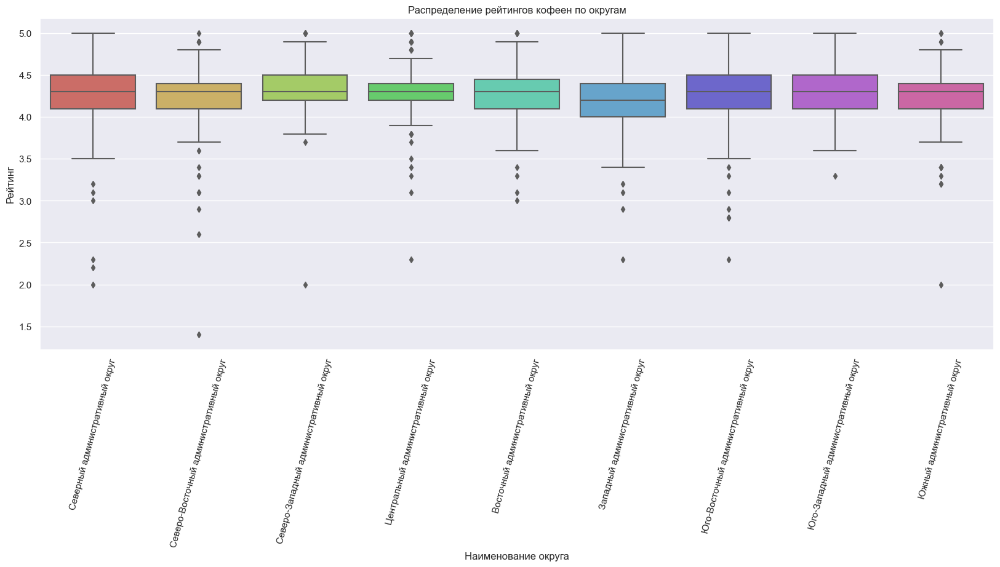

In [161]:
#с помощью графика посмотрим как рейтинги распределены по районам
sns.set(rc={'figure.figsize':(20,7)})
ax = sns.boxplot(x='district', y='rating', data=data_coffee, palette='hls') 
plt.title('Распределение рейтингов кофеен по округам')
plt.xlabel('Наименование округа')
plt.ylabel('Рейтинг')
plt.xticks(rotation=75)
plt.show()

**Вывод:** медианное значение рейтинга кофеен по всем округам равно 4.3. Это довольно высокий рейтинг для заведений общественного питания. Самые высокие рейтинги у кофеен в Северном, Западном, Юго-Восточном и Юго-Западном административных округах.
<br />

* [Рассчитаем на какую стоимость чашки капучино стоит ориентироваться при открытии](#analysis_coffee_raiting)

In [162]:
#рассчитаем медианное значение стоимости чашки кофе в разрезе по округам

price_coffee_district = (
    data_coffee.groupby(['district'])
    .agg({'middle_coffee_cup': 'median'})
    .sort_values(by='middle_coffee_cup', ascending=False)
    .reset_index()
)
price_coffee_district

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [163]:
fig = px.histogram(price_coffee_district, 
                   x='district',
                   y='middle_coffee_cup',
                   title='Медиана стоимости чашки кофе. Распределение по округам', 
                   nbins=1000)
fig.update_xaxes(title_text='Наименование округа')
fig.update_yaxes(title_text='Стоимость') 
fig.show() 

**Вывод:** стоимость чашки кофе колеблется от 198 руб. в Юго-Западном округе до 135 руб. в Восточном округе.
<br />

**Общий вывод и рекомендации:** кофейни довольно популярные заведения в Москве. В каждом из округов данная категория общественного питания на третьем месте.
<br />

Рейтинги кофеен довольно высокие, сопоставимые с рейтингами других заведений. 
<br />

Инвестору можно посоветовать рассмотреть открытие кофейни в Юго-Западном административном округе. В этом округе относительно невысокая доля данной категории заведений 6.86% от числа всех кофеен в Москве и 13% от всех категорий заведений в Юго-Западном округе. Здесь довольно высокий и стабильный рейтинг у кофеен (не опускается ниже 3.5).
<br />

Кроме того, самая высокая стоимость 1 чашки кофе (198 руб.) также в Юго-Западном административном округе, что непосредственно влияет на выручку и окупаемость проекта. Однако при этом, стоит уточнить еще затраты, в частности цену аренды помещений, предназначенных для открытия точек общественного питания.
<br />

Что касается открытия круглосуточной кофейни, то здесь стоит прежде всего ориентироваться на местоположение будущей точки продаж. Во всех остальных случаях это может обернуться дополнительными убытками.

Презентация: <https://drive.google.com/file/d/1Y3DI6rHUduZs0fWvgdZ5eTlVHjhXBCJ0/view?usp=sharing> 